In [1]:
import uproot
import pandas as pd
import numpy as np
import plotly
from pathlib import Path
import plotly.express as px
import wandb

In [2]:
cd ..

/global/u2/s/schuya/hgcal-dev


In [ ]:
from visualization.hcal import Event

In [5]:
root_dir = uproot.rootio.open('/global/cscratch1/sd/schuya/hgcal-dev/data/hcal/data.root')
root_events = root_dir.get('Events;1')

In [6]:
df = pd.DataFrame()
for k, v in root_events[b'HcalRecHit'].items():
    df[k.decode('ascii').split('.')[1]] = v.array()

In [7]:
events = []
for n in range(df.shape[0]):
    jagged_event = df.loc[n]
    df_dict = {k: jagged_event[k] for k in jagged_event.keys()}
    flat_event = pd.DataFrame(df_dict)
    flat_event.astype({'hit': int})
    events.append(Event(flat_event))


In [8]:
events[0].df

,fUniqueID,fBits,energy,timeFalling,time,x,y,z,hit
0,0,50331648,0.000000,-120.0,-9999.000000,176.761093,39.186989,-7.878279,0
1,0,50331648,0.000000,-120.0,-9999.000000,152.698349,97.279587,-7.878279,0
2,0,50331648,0.000000,-120.0,-9999.000000,69.285896,167.270950,-7.878280,0
3,0,50331648,0.000000,-120.0,-9999.000000,39.186996,176.761093,-7.878280,0
4,0,50331648,0.000000,-120.0,-9999.000000,7.897408,180.880447,-7.878280,0
...,...,...,...,...,...,...,...,...,...
797,0,50331648,0.000000,-100.0,-9999.000000,116.903458,54.512974,522.797974,1
798,0,50331648,0.335638,-100.0,6.058261,105.661339,73.984886,522.797974,1
799,0,50331648,3.172715,7.0,9.654989,91.569252,64.117477,522.797974,1
800,0,50331648,0.000000,-100.0,-9999.000000,87.946541,-7.694312,487.997986,1


In [9]:
flat_features = {}
for feature in ['energy', 'time', 'x', 'y', 'z']:
    flat_features[feature] = pd.concat([events[i].df[feature] for i in range(len(events))], ignore_index=True)

In [10]:
flat_features['energy']

0          0.000000
1          0.000000
2          0.000000
3          0.000000
4          0.000000
             ...   
7815592    1.324966
7815593    0.040010
7815594    0.029723
7815595    1.094589
7815596    0.233020
Name: energy, Length: 7815597, dtype: float32

In [12]:
for k in flat_features:
    print(f'{k}: {flat_features[k].max(axis=0)}')

energy: 253.07273864746094
time: 12.5
x: 264.3984680175781
y: 264.3984680175781
z: 522.7979736328125


In [5]:
wandb_id = '20200901230525'
wandb_project = 'hgcal-spvcnn'
wandb_entity = 'uw-hgcal'

In [6]:
input_dir = Path('/global/cscratch1/sd/schuya/hgcal-dev/data/hcal/rawpointclouds')
prediction_dir = Path('/global/cscratch1/sd/schuya/hgcal-dev/predictions/hcal/semantic-hcal')

In [7]:
event_names = [a.stem for a in sorted(prediction_dir.glob('*.npz'))]
events = [Event(input_dir / f'{e}.pkl', prediction_dir / f'{e}.npz') for e in event_names]

In [17]:
example_3d_truth_event = events[0].plot_3d(truth=True)
example_3d_truth_event.show()

In [18]:
example_3d_pred_event = events[0].plot_3d(truth=False)
example_3d_pred_event.show()

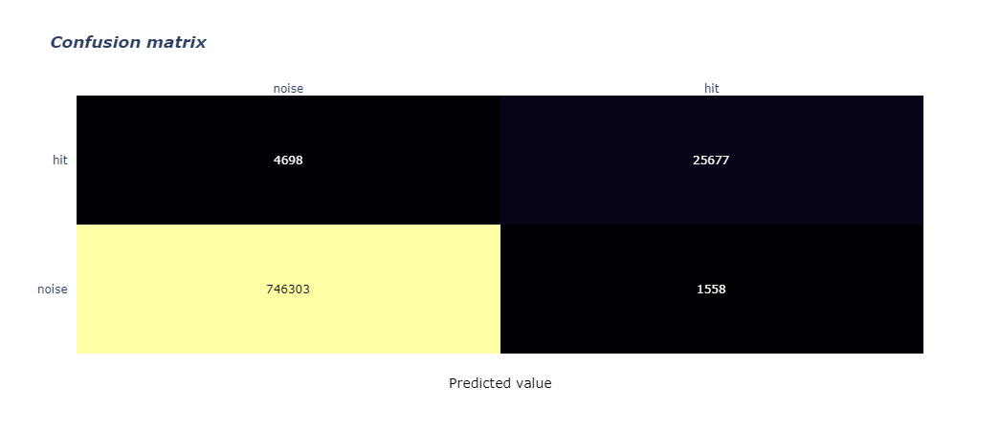

In [9]:
Event.plot_confusion_matrix(events, normalize=False)

In [11]:
normalized_confusion_matrix_fig = Event.plot_confusion_matrix(events, normalize=True)

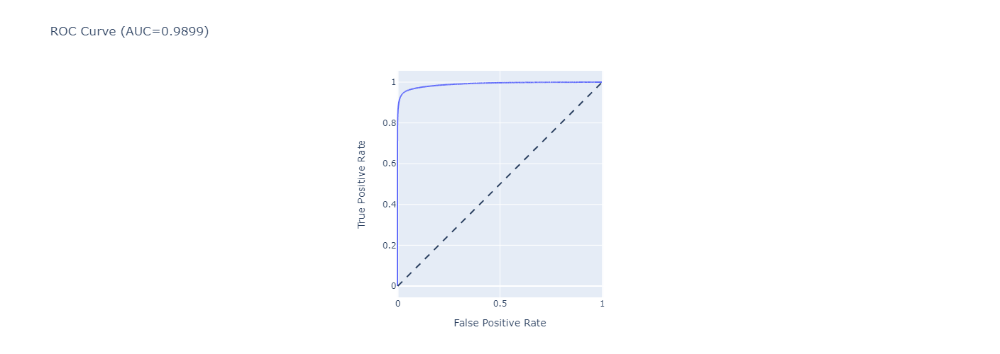

In [8]:
roc_fig = Event.plot_roc(events)
roc_fig.show()

In [9]:
wandb.init(id=wandb_id, entity=wandb_entity, project=wandb_project, resume='allow')

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


W&B Run: https://app.wandb.ai/uw-hgcal/hgcal-spvcnn/runs/20200901230525

Streaming file created twice in same run: /global/u2/s/schuya/hgcal-dev/wandb/run-20200902_085444-20200901230525/wandb-history.jsonl
Streaming file created twice in same run: /global/u2/s/schuya/hgcal-dev/wandb/run-20200902_085444-20200901230525/wandb-events.jsonl


In [14]:
wandb.log({'normalized confusion matrix': normalized_confusion_matrix_fig})

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [19]:
wandb.log({'Example 3D Truth Event': example_3d_truth_event})

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [20]:
wandb.log({'Example 3D Reconstructed Event': example_3d_pred_event})

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [10]:
wandb.log({'ROC Curve': roc_fig})

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
